In [3]:
import pandas as pd
import numpy as np
import math
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()
import plotly.express as px
import json
import IPython.display as ipd

## Data Overview

In [28]:
folder_path = '/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/'
csv_file = '/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/diagnosis.csv'

data = pd.read_csv(csv_file)
data.head()

,id,diagnosis,age,gender,country,height,smokingHabits
0,5e72e93a38d9b5000737f3aa,No,44,Male,United States,"{'value': 6.25, 'unit': 'Feet'}",I've never smoked
1,5e72f4ed93d85c0008831262,No,53,Male,Mexico,"{'value': 185, 'unit': 'Centimeters'}",I've used to smoke
2,5e72f6bb93d85c0008831263,No,52,Male,United States,"{'value': 167, 'unit': 'Centimeters'}",I've never smoked
3,5e72f8bb93d85c0008831264,No,52,Male,United States,"{'value': 167, 'unit': 'Centimeters'}",I've never smoked
4,5e72fd8b319d5b000813f71c,No,34,Male,United States,"{'value': 170, 'unit': 'Centimeters'}",I currently smoke


# Resolving conflicts
### 1. Fixing Smoking habits
### 2. Fixing Gender irregularities

In [116]:
smoking_habits =  {"I currently smoke":"I currently smoke",
"I used to smoke":"I used to smoke",
"Used to smoke but stopped in the last 5 years":"I used to smoke",
"I've never smoked":"I've never smoked",
"I've used to smoke":"I used to smoke",
"Not smoking":"I've never smoked",
"Smoking":"I currently smoke"}
def map_smokinghabits(val):
    return smoking_habits[val]
    

# Drop nans    
data_cleaned = data.dropna()

# fix smoking habits
data_cleaned['smoking_habits'] = data_cleaned['smokingHabits'].apply(lambda x:map_smokinghabits(x))
data_cleaned = data_cleaned.drop(columns={'smokingHabits'})

# Data Analysis

## Analysis on Gender 

In [157]:
d = data_cleaned[['id','diagnosis','gender','country','smoking_habits']].groupby("diagnosis")['gender'].value_counts().unstack(fill_value=0)
d.loc['percentage(in %)'] = (d.loc['Yes'] / d.loc['No'] * 100).round(1)
d


gender,Female,Male,Other
diagnosis,,,
No,670.0,1172.0,7.0
Yes,14.0,13.0,1.0
percentage(in %),2.1,1.1,14.3


## Analysis on Smoking Habits

In [158]:
d = data_cleaned[['id','diagnosis','gender','country','smoking_habits']].groupby("diagnosis")['smoking_habits'].value_counts().unstack(fill_value=0)
d.loc['percentage(in %)'] = (d.loc['Yes'] / d.loc['No'] * 100).round(1)
d

smoking_habits,I currently smoke,I used to smoke,I've never smoked
diagnosis,,,
No,206.0,368.0,1275.0
Yes,2.0,9.0,17.0
percentage(in %),1.0,2.4,1.3


## Analysis on Country 

In [148]:
"Total countries - ", len(data_cleaned['country'].unique())

('Total countries - ', 88)

In [149]:
data_cleaned['country'].value_counts()

Israel            807
United States     447
India             106
United Kingdom     53
Canada             45
                 ... 
Bahamas             1
Nepal               1
Uzbekistan          1
Jamaica             1
Gambia (the)        1
Name: country, Length: 88, dtype: int64

## Covid/Not Covid counts

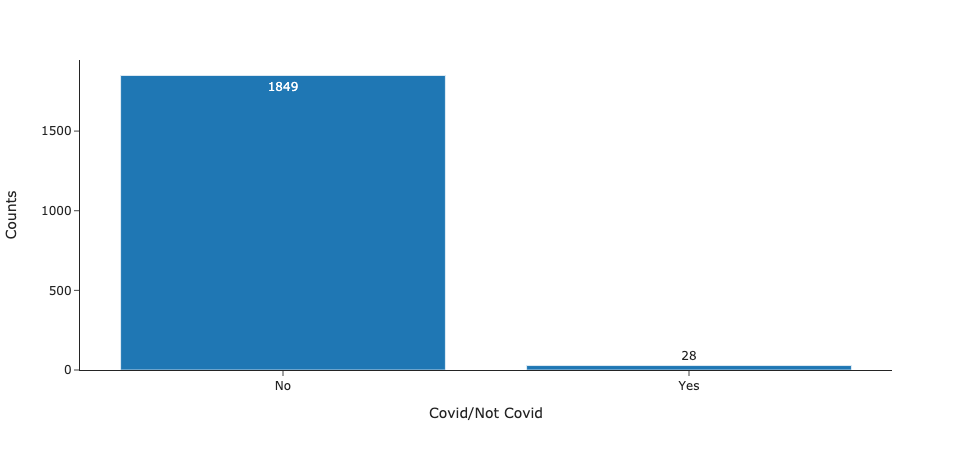

In [84]:
fig = px.bar(data, x=data_cleaned['diagnosis'].unique(), y=data_cleaned['diagnosis'].value_counts(),
             template="simple_white", labels={'x':'Covid/Not Covid','y':'Counts'},
             text=data_cleaned['diagnosis'].value_counts())
fig.show()

## Gender wise Covid/Not Covid counts

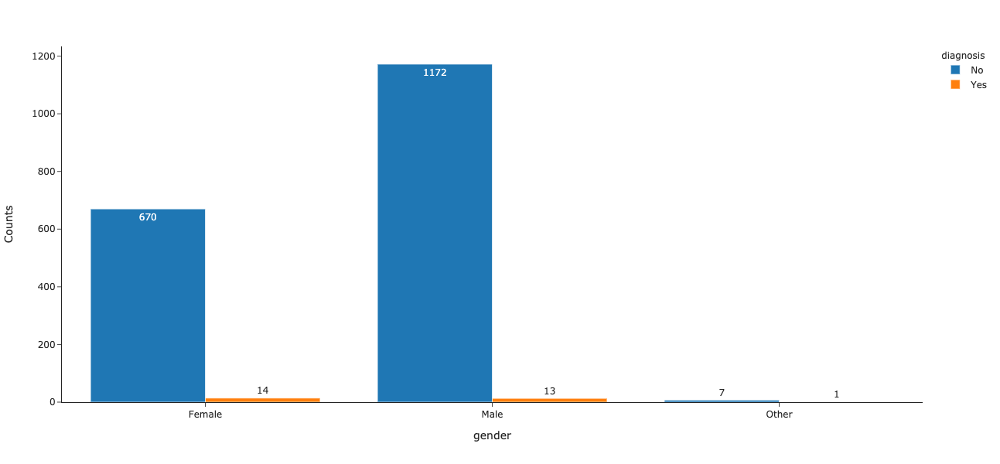

In [159]:
gender_grouped=data_cleaned[['id','gender','diagnosis']].groupby(['gender','diagnosis']).agg(['count'])
gender_grouped.reset_index(inplace=True)
gender_grouped

fig = px.bar(gender_grouped, x='gender', y='id',
             template="simple_white", labels={'id':'Counts'},color='diagnosis',barmode='group',
             height=600,text='id')
fig.show()

## Audio Recordings

In [216]:
submissions = json.load(open('/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/submissions.json','r'))

submissions_count = {'Yes':{},'No':{}}
def add_recordings_count(main_dict, recordings_dict):
    for key in list(recordings_dict.keys()):
        if key in main_dict:
            main_dict[key]+=1
        else:
            main_dict[key]=1
    return main_dict

for each in submissions:
    if 'covid19' in each['formData']:
        if each['formData']['covid19']['diagnosedCovid19'] == 'No' and 'recordings' in each:
            submissions_count['No'] = add_recordings_count(submissions_count['No'],each['recordings'])
        if each['formData']['covid19']['diagnosedCovid19'] == 'Yes' and 'recordings' in each:
            submissions_count['Yes'] = add_recordings_count(submissions_count['Yes'],each['recordings'])

recordings_df = pd.DataFrame.from_dict(submissions_count, orient='index')
recordings_df = recordings_df.drop('count',axis=1)
recordings_df

,cough,alphabet,eeee,oooo,aaaa,story,ABC,ooo,eee,aaa
Yes,39,29,29,28,28,4,NaN,NaN,NaN,NaN
No,1950,1751,1728,1699,1682,283,2.0,2.0,1.0,1.0


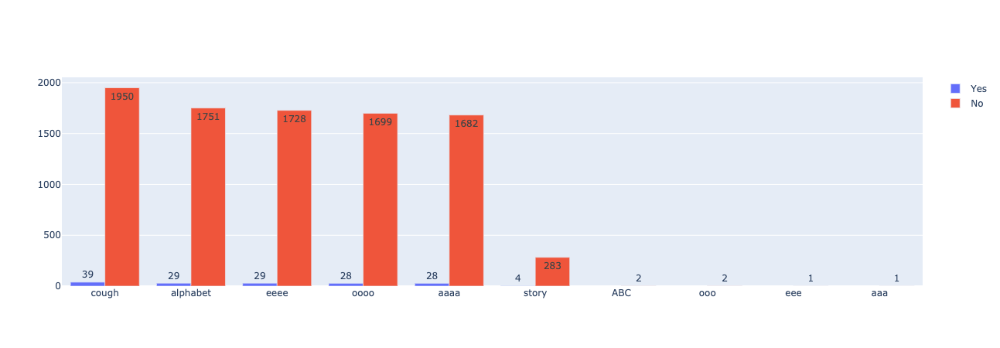

In [217]:
import plotly.offline as pyo
import plotly.figure_factory as ff
import plotly
import plotly.graph_objs as go
import pandas as pd
pyo.init_notebook_mode()
import cufflinks as cf
import plotly.express as px
from plotly.subplots import make_subplots
cf.go_offline()
import ipywidgets as widgets
def plot_multibar(x,y,categories, xlabel='', ylabel='', title='', filename='', legend_orientation=None, legend=None):
    plots = []
    layout = go.Layout(title=title, xaxis={'type':"category"}, 
                       legend_orientation=legend_orientation, xaxis_title=xlabel,yaxis_title=ylabel,
                      legend=legend)
    for i in range(len(y)):
        plots.append(go.Bar(x=x, y=y[i], name=categories[i], text=y[i],textposition='auto'))
    fig = dict(data=plots, layout=layout)
    pyo.iplot(fig, filename)
    
plot_multibar(recordings_df.columns,recordings_df.values, categories=recordings_df.index)

## Recording samples

### Alphabets

In [204]:
ipd.Audio(folder_path+'/5ee7084ac181770008edf2b3/alphabet.wav')

### AAA

In [203]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/aaaa.wav')

### Cough

In [205]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/cough.wav')

### EEE

In [207]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/eeee.wav')

### OOOO

In [208]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/oooo.wav')

## Covid vs Non Covid Recordings

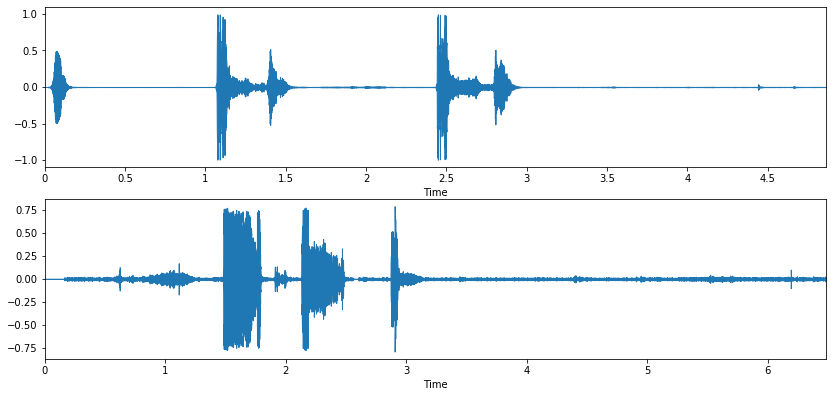

In [253]:
import librosa
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

not_covid, sr = librosa.load(folder_path+'/5eea2c7544e9ab000779b491/cough.wav')
covid, ssr = librosa.load(folder_path+'/5e78f5611ca30700071b98d9/cough.wav')
# y_harm, y_perc = librosa.effects.hpss(covid)

plt.figure(figsize=(14, 10))
plt.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

plt.subplot(3, 1, 1)
# plt.title('NON COVID SAMPLE')
# librosa.display.waveplot(y_harm, sr=sr, alpha=0.25)
# librosa.display.waveplot(y_perc, sr=sr, color='r', alpha=0.5)
librosa.display.waveplot(not_covid, sr=sr)


plt.subplot(3, 1, 2)
# plt.title('COVID SAMPLE')
librosa.display.waveplot(covid, sr=sr)



# TIMELINE

| Deadline       	| Description                                                                                                     	|
|----------------	|-----------------------------------------------------------------------------------------------------------------	|
| Jan 15, 2021   	| Extensive literature survey of latest work  COVID-19 diagnosis using Audio                                      	|
| Jan 22, 2021   	| Add COVID-19 datasets to existing MIT dataset                                                                   	|
| Jan 29, 2021   	| Start audio analysis on COVID-19 and Neutral samples                                                            	|
| Feb 5, 2021    	| Work on fixing data imbalance issues as COVID-19 samples <10% of entire dataset                                 	|
| Feb 12, 2021   	| Work on creating pipelines for audio representations (MFCC/GFCC/Mel Filters and Acoustic Low level descriptors) 	|
| Feb 19, 2021   	| Work on building Neural Network blocks to accommodate end to end training                                       	|
| March 5, 2021  	| Build modularized pipeline consisting data preprocessing and neural network block to run experiments            	|
| March 12, 2021 	| Evaluate and analyze model results and obtain validations from Advisor and Reader                               	|
| March 19, 2021 	| Begin writing thesis and start preparation to defend thesis                                                     	|
| March 26, 2021 	| Complete Thesis draft 1                                                                                         	|
| March 28, 2021 	| Complete Thesis draft 2                                                                                         	|
| March 30, 2021 	| Complete final Version of thesis                                                                                	|

# COSWARA DATA

In [2]:
coswara_basepath = '/Users/badgod/coswara_data/Coswara-Data/'

In [4]:
coswara_combined_data = pd.read_csv(coswara_basepath+'combined_data.csv')

In [74]:
coswara_combined_data.count()

id               1459
a                1459
covid_status     1459
ep               1459
g                1459
l_c              1459
l_l              1275
l_s              1459
rU                779
asthma             58
cough              95
smoker            106
test                1
ht                 89
cold               76
diabetes           72
um                421
ihd                 4
bd                 18
st                 48
fever              57
ftg                22
mp                 23
loss_of_smell      20
test_status        46
diarrhoea           1
cld                 3
pneumonia           3
dtype: int64

In [8]:
coswara_combined_data.head()

,id,a,covid_status,ep,g,l_c,l_l,l_s,rU,asthma,...,bd,st,fever,ftg,mp,loss_of_smell,test_status,diarrhoea,cld,pneumonia
0,DRBAZX64nuVtqBQf13gH7r36Mh52,26,healthy,y,female,United States,Madison,Wisconsin,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Jw7YMfwGqMX22UbHh1TTgYMTYWs1,16,healthy,y,female,India,24 pargana,West Bengal,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,xa2v8z3Yzgb9dFrq2gEZz6oS7fh1,26,resp_illness_not_identified,y,male,India,Kolkata,West Bengal,n,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,xwHQrG0KwjTLJvBYVtVXfHp4JAd2,32,resp_illness_not_identified,y,male,Sri Lanka,Sri Jatawardanapura,Western Province,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,xKW2EpGmJcfigLecUTLVXEWQHPg2,22,healthy,y,male,India,Kolkata,West Bengal,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
coswara_combined_data.isnull().sum()

id                  0
a                   0
covid_status        0
ep                  0
g                   0
l_c                 0
l_l               184
l_s                 0
rU                680
asthma           1401
cough            1364
smoker           1353
test             1458
ht               1370
cold             1383
diabetes         1387
um               1038
ihd              1455
bd               1441
st               1411
fever            1402
ftg              1437
mp               1436
loss_of_smell    1439
test_status      1413
diarrhoea        1458
cld              1456
pneumonia        1456
dtype: int64

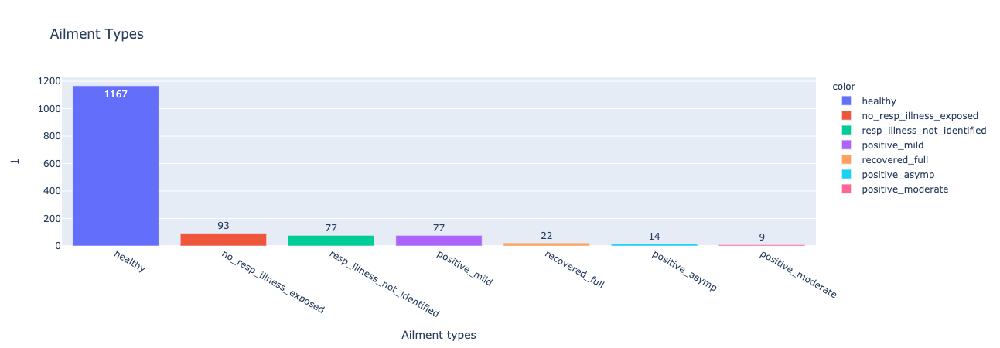

In [71]:
covid_status = pd.DataFrame(coswara_combined_data['covid_status'].value_counts().to_dict(),index=[1]).T
covid_status
fig = px.bar(covid_status, x=covid_status.index, y=1, labels=dict(x='Ailment types',y='Count'),color=covid_status.index,text=1,title='Ailment Types')
fig.show()

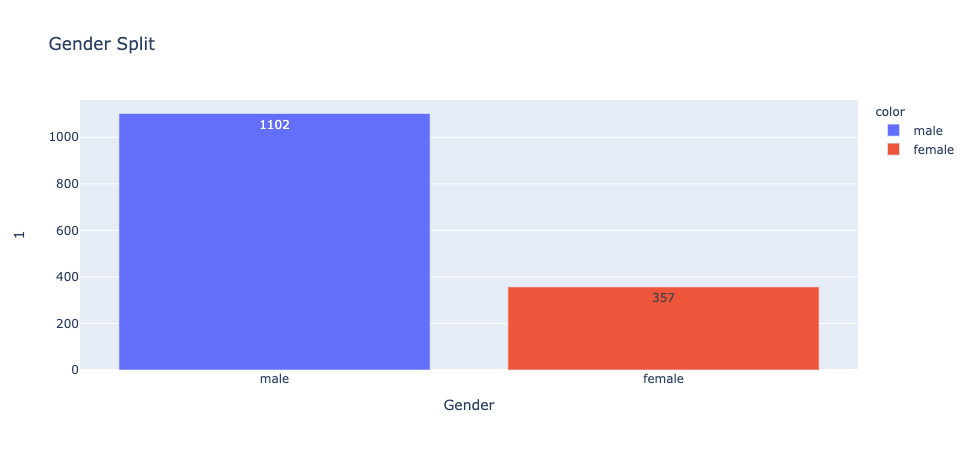

In [72]:
coswara_gender = pd.DataFrame(coswara_combined_data['g'].value_counts().to_dict(),index=[1]).T
coswara_gender
fig = px.bar(coswara_gender, x=coswara_gender.index, y=1, labels=dict(x='Gender',y='Count'),color=coswara_gender.index,text=1,title='Gender Split')
fig.show()

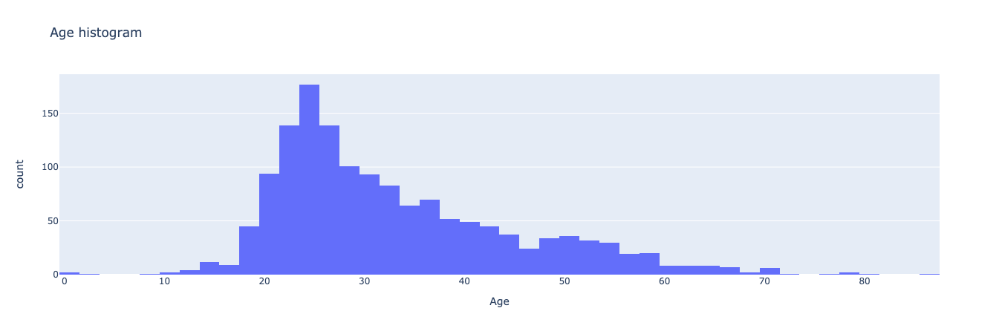

In [73]:
coswara_age = pd.DataFrame(coswara_combined_data['a'].value_counts().sort_index().to_dict(),index=[1]).T
coswara_age
fig = px.histogram(coswara_combined_data, x=coswara_combined_data['a'],labels=dict(a='Age',y='Count'),title='Age histogram')
fig.show()

In [8]:
import glob
import os
import subprocess
for path in glob.glob(coswara_basepath+'/2*'):
    print("cat",path+"/*.tar.gz.*",">","file_name.tar.gz")

cat /Users/badgod/coswara_data/Coswara-Data/20200413/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200820/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200415/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200424/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200502/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200505/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200504/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200707/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200901/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200930/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20201012/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20201031/*.tar.gz.* > file_name.tar.gz
cat 